# Figures for article

Combined data from datasets 300 C #1, #2, #3.

Håkon Wiik Ånes (hakon.w.anes@ntnu.no)

In [120]:
%matplotlib inline

from datetime import date
import importlib_metadata
import gc
import os

import dask
from dask.diagnostics import ProgressBar
from matplotlib_scalebar.scalebar import ScaleBar
from mpl_toolkits.axes_grid1 import host_subplot
import matplotlib.colors as mcolors
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import morphops
import numpy as np
import pandas
import scipy.ndimage as ndimage
import scipy.stats as scs
import skimage.color as skc
import skimage.transform as skt

import kikuchipy as kp
from mapregions import MapRegions
from orix import io
from orix.quaternion import Orientation, Rotation

# Directories for input and output
dset_no = 1  # Data set number
dir_sample = "/home/hakon/phd/data/p/prover/300c"
dir_article = "/home/hakon/phd/artikler_abstract/202104_correlating_ebsd_bse/latex"
dir_bse = os.path.join(dir_sample, str(dset_no), "bse")
dir_kp = os.path.join(dir_sample, str(dset_no), "kp")
dir_mtex = os.path.join(dir_sample, str(dset_no), "mtex")
if dset_no == 1:
    dir_article_fig = os.path.join(dir_article, "fig")
else:
    dir_article_fig = os.path.join(dir_article, "supplementary/fig", str(dset_no))
    
# Matplotlib configuration and keyword arguments
plt.rcParams.update({"font.size": 13, "figure.dpi": 300})
scalebar_kwds = dict(
    units="um",
    dimension="si-length",
    location="lower left",
    pad=0.2,
    sep=3,
    border_pad=0.5,
    box_alpha=0.6,
    fixed_value=15,
)
scatter_kwds = dict(s=70, linewidth=2, facecolor="none", clip_on=False)
savefig_kwds = dict(bbox_inches="tight", pad_inches=0, dpi=300, transparent=True)
title_kwds = dict(ha="left", va="bottom", fontweight="bold")

# Particle size thresholds
dispersoid_threshold = 0.24  # um
constituent_particle_threshold = 1  # um

# Data set specific parameters
n_cps = {1: 81, 2: 94, 3: 88}
pad_grid = {1: 50, 2: 275, 3: 150}
cp_fig_w_pad = {1: -10, 2: -15, 3: -15}
grid_fig_w_pad = {1: -5, 2: -14, 3: -12}
overlap_fig_w_pad = {1: -8.5, 2: -20, 3: -18}
overlap_fig_fontsize_sub = {1: 1, 2: 3, 3: 3}
shift_rc = {1: (310, 251), 2: (1124, 927), 3: (617, 600)}
map_width_dset = {1: 916, 2: 722, 3: 839}

print("Run date: ", date.today())
print("\nSoftware versions\n------------------")
for pkg in (
    "dask",
    "kikuchipy",
    "mapregions",
    "matplotlib",
    "matplotlib_scalebar",
    "morphops",
    "numpy",
    "orix",
    "pandas",
    "scipy",
    "scikit-image"
):
    if pkg == "numpy":
        ver = np.__version__
    else:
        ver = importlib_metadata.version(pkg)
    print(pkg, ":", ver)

Run date:  2022-03-27

Software versions
------------------
dask : 2022.2.1
kikuchipy : 0.6.dev0
mapregions : 0.1.dev0
matplotlib : 3.4.3
matplotlib_scalebar : 0.8.1
morphops : 0.1.13
numpy : 1.21.5
orix : 0.9.dev0
pandas : 1.4.1
scipy : 1.8.0
scikit-image : 0.19.2


In [88]:
class AnyObject:
    pass


class AnyObjectHandler:
    """Custom error bar legend from
    https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler.
    """
    def legend_artist(self, legend, orig_handle, fontsize, handlebox):
        x0, y0 = handlebox.xdescent, handlebox.ydescent
        width, height = handlebox.width, handlebox.height
        wratio = 0.25
        x1, y1 = ((x0 + width * wratio, width * (1 - wratio)), (y0, y0))
        x2, y2 = ((x0 + width * wratio, width * (1 - wratio)), (height, height))
        x3, y3 = ((width / 2,) * 2, (y0, height))
        for x, y in zip((x1, x2, x3), (y1, y2, y3)):
            patch = mlines.Line2D(x, y, color="k", transform=handlebox.get_transform())
            handlebox.add_artist(patch)
        return patch

In [89]:
# Nominal step sizes nm/px
step = dict(ebsd=100, bse=1 / 38.5e-3)

## Figure 1. Control points

In [90]:
bse = plt.imread(os.path.join(dir_bse, "4500x_cropped2_fused_crop.png"))
bse = skc.rgb2gray(bse[..., :3])
ebsd = plt.imread(os.path.join(dir_kp, "maps_mean_q1_q99.png"))
ebsd = skc.rgb2gray(ebsd[..., :3])

In [94]:
cp_c_ebsd, cp_r_ebsd, cp_c_bse, cp_r_bse = np.loadtxt(
    os.path.join(dir_bse, "cps_300c_cropped2_fused_crop.csv"),
    skiprows=1,
    max_rows=n_cps[dset_no] + 1,
    usecols=(1, 2, 3, 4),
    delimiter=",",
    unpack=True,
)
cp_ebsd = np.column_stack((cp_r_ebsd, cp_c_ebsd))
cp_bse = np.column_stack((cp_r_bse, cp_c_bse))

# Scale BSE CPs to maintain EBSD resolution
cp_bse_scale = cp_bse / (step["ebsd"] / step["bse"])

# Translate BSE CPs
cp_bse_translate = cp_bse_scale - (cp_bse_scale.mean(axis=0) - cp_ebsd.mean(axis=0))
cp_list = (cp_ebsd, cp_bse_translate)
cps = np.concatenate(cp_list)

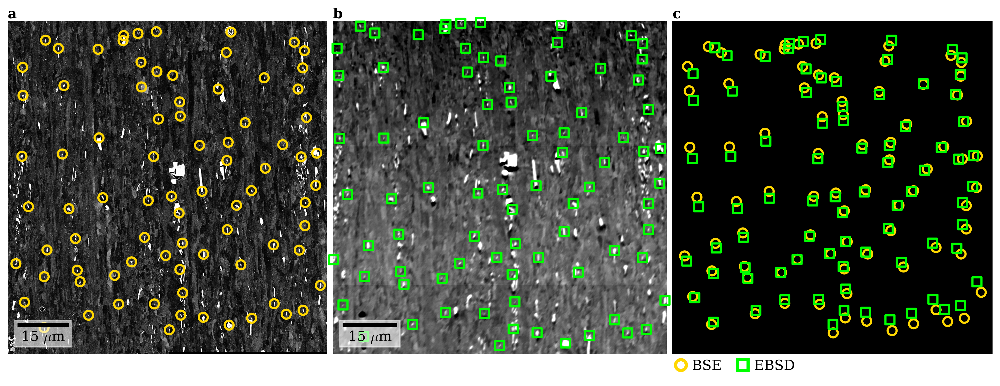

In [95]:
# Keyword arguments shared among Matplotlib calls
imshow_kwds = dict(cmap="gray", interpolation=None)
markers = ["o", "s"]
marker_colors = ["gold", "lime"]

fig, axes = plt.subplots(ncols=3, figsize=(15, 5))
ax0, ax1, ax2 = axes
ax0.imshow(bse, **imshow_kwds)
ax1.imshow(ebsd, **imshow_kwds)
pad = (130, 70)
nr, nc = tuple(cps.max(axis=0).astype(int) + np.array(pad))
ax2.imshow(np.zeros((nr, nc)), cmap="gray")

# Legend
names = ["BSE", "EBSD"]
handles = []
marker_kwds = dict(linestyle="None", markersize=10, fillstyle="none", markeredgewidth=3)
for i in range(len(names)):
    handle = mlines.Line2D([], [], color=marker_colors[i], label=names[i], marker=markers[i], **marker_kwds)
    handles.append(handle)
ax2.legend(
    bbox_to_anchor=(-0.035, 0),
    loc="upper left",
    borderaxespad=0,
    handles=handles,
    handletextpad=-0.2,
    frameon=False,
    columnspacing=0.5,
    ncol=len(names)
)

# Scalebars
ax0.add_artist(ScaleBar(dx=step["bse"] * 1e-3, **scalebar_kwds))
ax1.add_artist(ScaleBar(dx=step["ebsd"] * 1e-3, **scalebar_kwds))

# Control points
for i, (y, x) in enumerate(cp_bse):
    ax0.scatter(x, y, marker=markers[0], color=marker_colors[0], **scatter_kwds)
for i, (y, x) in enumerate(cp_ebsd):
    ax1.scatter(x, y, marker=markers[1], color=marker_colors[1], **scatter_kwds)
for i, these_points in enumerate(cp_list):
    for r, c in these_points:
        ax2.scatter(
            c + pad[1] / 2,
            r + pad[0] / 2,
            color=marker_colors[i],
            marker=markers[i],
            **scatter_kwds
        )

# Remove margins and add subfigure titles
for ax, title in zip(axes, ("a", "b", "c")):
    ax.axis("off")
    ax.margins(0, 0)
    ax.text(0, 1, title, transform=ax.transAxes, **title_kwds)
fig.tight_layout(w_pad=cp_fig_w_pad[dset_no])

# Save figure
fig.savefig(os.path.join(dir_article_fig, "control_points", "_control_points_only.svg"), **savefig_kwds)

## Figure 2. Grid before and after correction of EBSD intensity map

Scale BSE CP coordinates to maintain the EBSD map resolution

In [96]:
cp_bse_scale = cp_bse / (step["ebsd"] / step["bse"])

All CPs and the EBSD intensity image is scaled in order to make the frames
before and after correction smoother

In [97]:
scale_smooth = 3

ebsd_rescale = skt.rescale(ebsd, scale=scale_smooth)
cp_bse_scale_smooth = cp_bse_scale * scale_smooth
cp_ebsd_smooth = cp_ebsd * scale_smooth

padding = pad_grid[dset_no] * scale_smooth
padding4 = ((padding,) * 2,) * 2
ebsd_padded = np.pad(ebsd_rescale, pad_width=padding4)

In [98]:
out_shape = ebsd_padded.shape
out_size = int(np.prod(out_shape))
rc_out = np.indices(out_shape, dtype=float).reshape((2, -1)).T

delayed_list = []
n_chunks = 100
chunk_size = int(np.ceil(out_size / n_chunks))
for idx in range(0, n_chunks * chunk_size, chunk_size):
    rc_chunk = rc_out[idx:idx + chunk_size]
    rc_in_part = dask.delayed(morphops.tps_warp)(
        X=cp_bse_scale_smooth, Y=cp_ebsd_smooth, pts=rc_chunk
    )
    delayed_list.append(rc_in_part)

with ProgressBar():
    rc_in_parts = dask.compute(*delayed_list)
rc_in = np.row_stack(rc_in_parts)

[########################################] | 100% Completed | 13.1s


In [99]:
def get_mapping_arrays(rc_in, in_shape, out_shape):
    """Get 1D indices of corresponding points in input and output
    arrays.
    
    Parameters
    ----------
    rc_in : numpy.ndarray
    in_shape : tuple
    out_shape : tuple
    
    Returns
    -------
    rc_in_1d : numpy.ndarray
    rc_in_2d : tuple of numpy.ndarray
    rc_out_1d : numpy.ndarray
    rc_out_2d : tuple of numpy.ndarray
    """
    # Round exact input coordinates to nearest neighbour coordinates
    rc_in_int = np.round(rc_in).astype(int)

    # Set up output coordinate array
    rc_out = np.indices(out_shape).reshape((2, -1)).T
    
    # Remove coordinates outside input map in both arrays
    is_outside = np.logical_or((rc_in_int < 0).any(axis=1), (rc_in_int >= np.array(in_shape)).any(axis=1))
    is_outside_idx = np.where(is_outside)[0]
    rc_in_int = np.delete(rc_in_int, is_outside_idx, axis=0)
    rc_out = np.delete(rc_out, is_outside_idx, axis=0)
    
    # Get 1D indices
    rc_in_1d = np.ravel_multi_index(rc_in_int.T, in_shape)
    rc_out_1d = np.ravel_multi_index(rc_out.T, out_shape)

    # 2D coordinate arrays
    rc_in_2d = np.unravel_index(rc_in_1d, in_shape)
    rc_out_2d = np.unravel_index(rc_out_1d, out_shape)
    
    return rc_in_1d, rc_in_2d, rc_out_1d, rc_out_2d


def map_in_image(in_image, out_shape, rc_in_2d, rc_out_2d):
    """Map sensed (in) image from sensed coordinates to
    reference coordinates.
    
    Parameters
    ----------
    in_image : numpy.ndarray
    out_shape : tuple
    rc_in_2d : tuple of numpy.ndarray
    rc_out_2d : tuple of numpy.ndarray
    
    Returns
    -------
    out_image : numpy.ndarray
    """
    out_image = np.zeros(out_shape, dtype=in_image.dtype)
    out_image[rc_out_2d] = in_image[rc_in_2d]
    return out_image

In [100]:
rc_in_1d, rc_in_2d, rc_out_1d, rc_out_2d = get_mapping_arrays(
    rc_in=rc_in, in_shape=ebsd_padded.shape, out_shape=out_shape
)

In [101]:
# Shift corrected (0, 0) to un-corrected (0, 0) to account for BSE image (0, 0)
# not coinciding with EBSD intensity map (0, 0), found manually
shift_r, shift_c = shift_rc[dset_no]
rc_out_2d = (rc_out_2d[0] - shift_r + padding, rc_out_2d[1] - shift_c + padding)
ebsd_correct = map_in_image(ebsd_padded, out_shape, rc_in_2d, rc_out_2d)

In [102]:
frame_width = int(np.ceil(out_shape[0] / 180))
frame = np.zeros_like(ebsd_rescale, dtype=bool)
fill = 1
frame[:frame_width] = fill
frame[-frame_width:] = fill
frame[:, :frame_width] = fill
frame[:, -frame_width:] = fill

spacing = int(np.ceil(out_shape[0] / 20))
line_width = frame_width
for i in range(spacing, np.max(frame.shape), spacing):
    frame[i:i + line_width, :] = fill
    frame[:, i:i + line_width] = fill

frame = np.pad(frame, pad_width=2 * (padding,))
frame_correct = map_in_image(frame, out_shape, rc_in_2d, rc_out_2d)

# Attach frames to EBSD map and corrected EBSD map
ebsd_padded_frame = np.zeros(ebsd_padded.shape + (3,))
ebsd_correct_frame = np.zeros_like(ebsd_padded_frame)
frame_color = mcolors.to_rgb("orangered")
frame_correct_color = mcolors.to_rgb("cyan")
for i in range(3):
    ebsd_padded_frame[..., i] = ebsd_padded
    ebsd_padded_frame[frame, i] = frame[frame] * frame_color[i]
    ebsd_correct_frame[..., i] = ebsd_correct
    ebsd_correct_frame[frame_correct, i] = frame_correct[frame_correct] * frame_correct_color[i]

frames = np.zeros(ebsd_padded.shape + (3,))
for i in range(3):
    frames[frame, i] = frame[frame] * frame_color[i]
    frames[frame_correct, i] = frame_correct[frame_correct] * frame_correct_color[i]

In [116]:
# Crop away unnecessary padding
r_edges = [np.inf, -np.inf]
c_edges = [np.inf, -np.inf]
for img in [ebsd_padded_frame, ebsd_correct_frame, frames]:
    img_gray = skc.rgb2gray(img)
    edges = np.where(img_gray != 0)
    r_edges = [min([r_edges[0], edges[0][0]]), max([r_edges[1], edges[0][-1]])]
    c_edges = [min([c_edges[0], edges[1][0]]), max([c_edges[1], edges[1][-1]])]
p = 40
sl = (
    slice(r_edges[0] - p, r_edges[1] + p),
    slice(c_edges[0] - 2 * p, c_edges[1] + p)
)

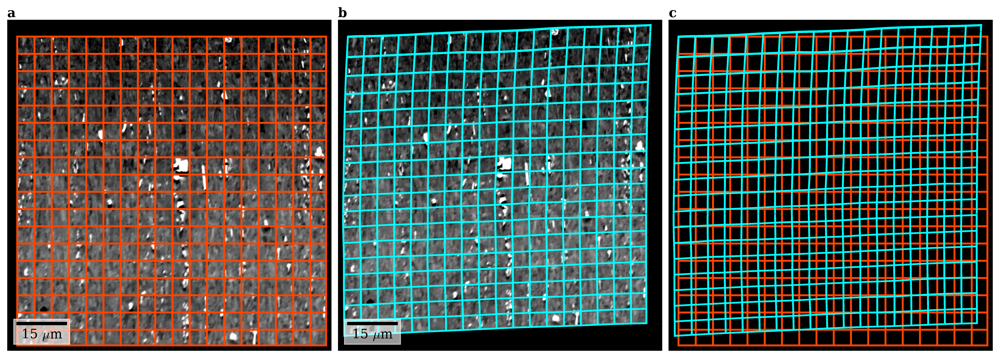

In [129]:
fig, axes = plt.subplots(ncols=3, figsize=(15, 5))
axes[0].imshow(ebsd_padded_frame[sl])
axes[1].imshow(ebsd_correct_frame[sl])
axes[2].imshow(frames[sl])
titles = ("a", "b", "c")
for i, ax in enumerate(axes):
    ax.text(0, 1, titles[i], transform=ax.transAxes, **title_kwds)
    if i != 2:
        ax.add_artist(ScaleBar(dx=step["ebsd"] * 1e-3 / scale_smooth, **scalebar_kwds))
    ax.margins(0, 0)
    ax.axis("off")
fig.tight_layout(w_pad=grid_fig_w_pad[dset_no])
fig.savefig(os.path.join(dir_article_fig, "image_registration", "image_registration.pdf"), **savefig_kwds)
gc.collect();

## Figure 3. Particles detected in BSE image and EBSD intensity image

In [122]:
n_particles_bse = np.load(os.path.join(dir_bse, "n_particles_roi.npy"))
label_map_bse, _ = ndimage.label(n_particles_bse != 0)
regions_bse = MapRegions(label_map_bse, background_label=0)
regions_bse

MapRegions: 4972

In [123]:
mask = np.load(os.path.join(dir_bse, "mask_ebsd_correct.npy"))
label_map_ebsd = np.load(os.path.join(dir_bse, "ebsd_labels_filled.npy"))
regions_ebsd = MapRegions(label_map_ebsd, background_label=0)
regions_ebsd

MapRegions: 217

In [124]:
# EBSD
ebsd_color = (0, 1, 0)
is_particle_ebsd = ~regions_ebsd.is_background_map
particles_ebsd = np.ones(regions_ebsd.map_shape + (3,))
particles_ebsd[is_particle_ebsd] = ebsd_color

# BSE
bse_color = (1, 0, 1)
is_particle_bse = ~regions_bse.is_background_map
particles_bse = np.ones(regions_bse.map_shape + (3,))
particles_bse[is_particle_bse] = bse_color

# Overlapped
particles_overlap = np.ones(regions_ebsd.map_shape + (3,))
particles_overlap[is_particle_ebsd] -= bse_color
particles_overlap[is_particle_bse] -= ebsd_color

Quantify overlap of total pixels not white:
* % black
* % pink
* % green

In [125]:
n_pixels = int(np.prod(particles_overlap.shape[:2]))

particles_overlap_flat = particles_overlap.reshape((n_pixels, 3))
unique_colors, counts = np.unique(particles_overlap_flat, axis=0, return_counts=True)
# (000), (010), (101), (111)

In [126]:
n_colored_pixels = n_pixels - counts[3]
n_overlap_pixels = counts[0]
n_ebsd_pixels = counts[1]
n_bse_pixels = counts[2]

pct_overlap = 100 * n_overlap_pixels / n_colored_pixels
pct_ebsd = 100 * n_ebsd_pixels / n_colored_pixels
pct_bse = 100 * n_bse_pixels / n_colored_pixels

print(
    f"Pixels:\t\t\t{n_pixels}",
    f"\nColored pixels (%):\t{n_colored_pixels} (100%)"
    f"\nOverlap (%):\t\t{n_overlap_pixels} ({pct_overlap:.2f}%)"
    f"\nEBSD (%):\t\t{n_ebsd_pixels} ({pct_ebsd:.2f}%)"
    f"\nBSE (%):\t\t{n_bse_pixels} ({pct_bse:.2f}%)"
)

Pixels:			1000000 
Colored pixels (%):	35409 (100%)
Overlap (%):		12831 (36.24%)
EBSD (%):		3215 (9.08%)
BSE (%):		19363 (54.68%)


In [127]:
particles_ebsd_mask = np.zeros(particles_ebsd.shape)
particles_bse_mask = np.zeros_like(particles_ebsd_mask)
particles_overlap_mask = np.zeros_like(particles_ebsd_mask)
is_particle_ebsd_mask = np.zeros(particles_ebsd.shape[:2])

particles_ebsd_mask[mask] = particles_ebsd[mask]
particles_bse_mask[mask] = particles_bse[mask]
particles_overlap_mask[mask] = particles_overlap[mask]
is_particle_ebsd_mask[mask] = is_particle_ebsd[mask]

r_mask, c_mask = np.where(mask)
slice_mask = (slice(r_mask.min(), r_mask.max()), slice(c_mask.min(), c_mask.max()))

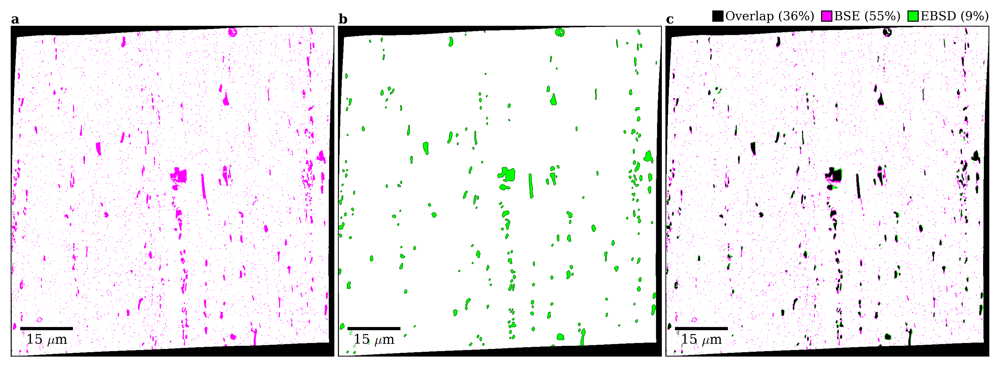

In [128]:
fig, axes = plt.subplots(ncols=3, figsize=(15, 5))
ax0, ax1, ax2 = axes

# Images
ax0.imshow(particles_bse_mask[slice_mask])
ax1.imshow(particles_ebsd_mask[slice_mask])
ax2.imshow(particles_overlap_mask[slice_mask])

# Contours on EBSD map
ax1.contour(is_particle_ebsd_mask[slice_mask], colors=((0, 0.5, 0),), linewidths=0.25)

# Legend c)
names = (
    f"EBSD ({np.round(pct_ebsd):.0f}%)",
    f"BSE ({np.round(pct_bse):.0f}%)",
    f"Overlap ({np.round(pct_overlap):.0f}%)"
)
colors = [ebsd_color, bse_color, "k"]
marker_kwds = dict(linestyle="None", markersize=10, markeredgecolor="k")
handles = []
for i in range(len(names)):
    handle = mlines.Line2D([], [], color=colors[i], label=names[i], marker="s", **marker_kwds)
    handles.append(handle)
ax2.legend(
    bbox_to_anchor=(0.975, 1.02),
    handles=handles[::-1],
    ncol=3,
    handletextpad=-0.4,
    columnspacing=0,
    borderaxespad=-1,
    borderpad=0.3,
    frameon=False,
    fontsize=plt.rcParams["font.size"] - overlap_fig_fontsize_sub[dset_no],
)

for ax, title in zip(axes, ("a", "b", "c")):
    ax.text(0, 1, title, transform=ax.transAxes, **title_kwds)
    ax.add_artist(ScaleBar(dx=step["ebsd"] * 1e-3, **scalebar_kwds))
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    ax.margins(0, 0)

fig.tight_layout(w_pad=overlap_fig_w_pad[dset_no])

# Save figure
fig.savefig(os.path.join(dir_article_fig, "overlapping_particles", "overlapping_particles.pdf"), **savefig_kwds)

## Figure 4. Multi-modal data set with subgrains and particles

In [79]:
ipf_map = plt.imread(os.path.join(dir_mtex, "maps_om_ipf_rd.png"))
grain_map = plt.imread(os.path.join(dir_mtex, "maps_grains_ideal_particles.png"))
reg_bse = plt.imread(os.path.join(dir_bse, "reg_bse_no_padding.png"))
reg_bse = skc.rgb2gray(reg_bse[..., :3])

ipf = plt.imread(os.path.join(dir_mtex, "ipf_annotated.png"))

# Map width has changed after correction, from 919 to 916
map_width = map_width_dset[dset_no]

In [80]:
detail_scale = reg_bse.shape[0] / ipf_map.shape[0]
ipf_map_scale = skt.rescale(ipf_map, detail_scale, channel_axis=2)
grain_map_scale = skt.rescale(grain_map, detail_scale, channel_axis=2)

# Detail slice
sl_detail = (slice(1480, 2110), slice(1304, 2179))

# Detail rectangle values
xy = np.array((sl_detail[1].start, sl_detail[0].start)) / detail_scale
width = (sl_detail[1].stop / detail_scale) - xy[0]
height = (sl_detail[0].stop / detail_scale) - xy[1]
rectangle_kwds = dict(xy=xy, width=width, height=height, ec="w", fc="none", linewidth=2)

In [81]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 10

### IPF map

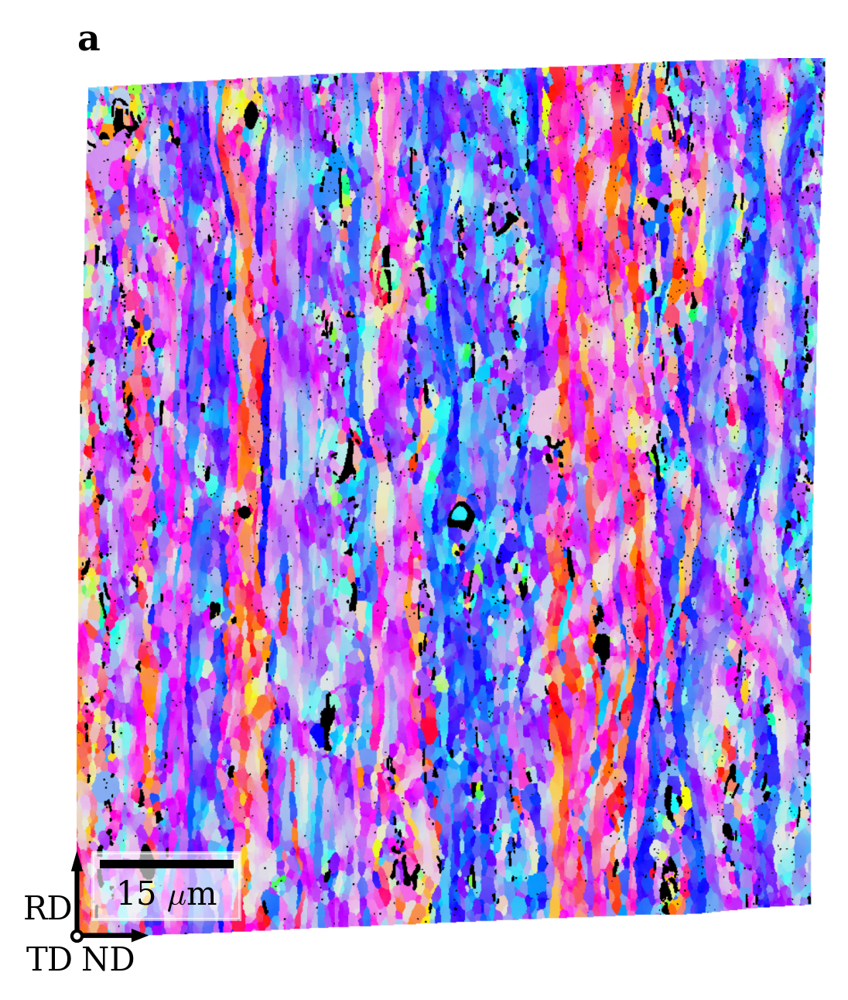

In [82]:
# Remove border when saved with Matlab (export_fig)
ipf_map2 = ipf_map[3:-3, 3:-3]

fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(ipf_map2)
ax.add_artist(ScaleBar(dx=(map_width / ipf_map2.shape[1]) * step["ebsd"] * 1e-3, **scalebar_kwds))
ax.text(0, 1, "a", fontweight="bold", fontsize=11, transform=ax.transAxes, ha="left", va="bottom")
ax.axis("off")
dx = 0.075

# Sample reference frame
width = 0.002
head_width = 5 * width
arrow_kwargs = dict(
    transform=ax.transAxes, clip_on=False, width=width, head_width=head_width, fc="k"
)
ax.arrow(0, 0, 0, dx, **arrow_kwargs)
ax.arrow(0, 0, dx, 0, **arrow_kwargs)
ax.scatter(0, 0, marker="o", s=10, ec="k", c="w", transform=ax.transAxes, zorder=2, clip_on=False);
(x, y) = (-0.005, -0.01)
ax.text(x, dx * 0.4, "RD", transform=ax.transAxes, va="center", ha="right")
ax.text(dx * 0.55, y, "ND", transform=ax.transAxes, va="top", ha="center")
ax.text(x, y, "TD", transform=ax.transAxes, va="top", ha="right")
if dset_no == 1:
    # Detail rectangle
    ax.add_artist(mpatches.Rectangle(**rectangle_kwds))
    ax.text(*rectangle_kwds["xy"], "d", fontweight="bold", va="bottom", ha="left", color="k", fontsize=11, bbox=dict(color="w", alpha=0.75, boxstyle="round,pad=0"));
    # Arrows indicating particle bands
    ax.text(0.59, 1.01, "Particle bands", transform=ax.transAxes)
    x_band = (0.03, 0.2, 0.42, 0.53, 0.93)
    y_band = (1.006, 1.015, 1.025, 1.03, 1.04)
    for x, y in zip(x_band, y_band):
        ax.arrow(x, y, dx=0, dy=-0.02, transform=ax.transAxes, clip_on=False, head_width=0.01, fc="k")
fig.savefig(os.path.join(dir_article_fig, "grains_particles", "ipf_map.svg"), **savefig_kwds)

### Grains

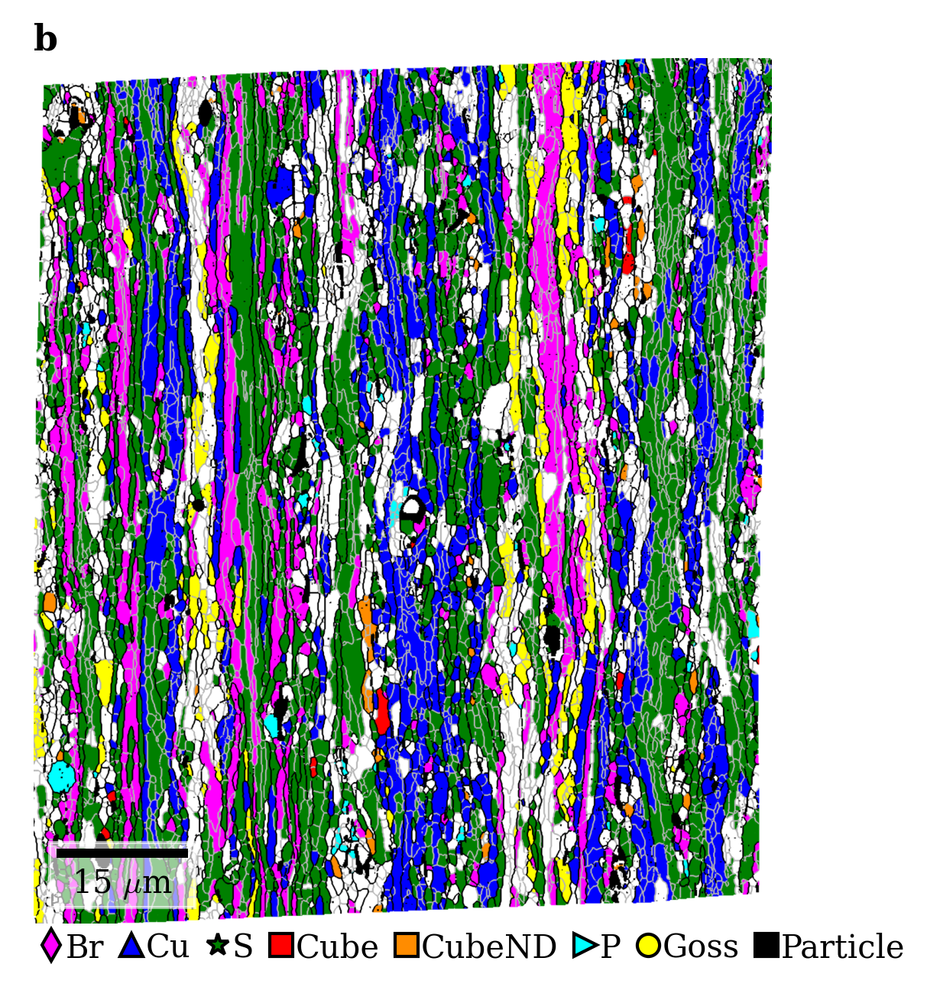

In [83]:
grain_map2 = grain_map[5:-4, 5:-4]

fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(grain_map2)
ax.text(0, 1, "b", fontsize=11, fontweight="bold", transform=ax.transAxes, ha="left", va="bottom")
ax.add_artist(ScaleBar(dx=(map_width / grain_map2.shape[1]) * step["ebsd"] * 1e-3, **scalebar_kwds))
ax.axis("off")
ax.margins(0, 0)
names = ["Br", "Cu", "S", "Cube", "CubeND", "P", "Goss", "Particle"]
markers = ["d", "^", "*", "s", "s", ">", "o", "s"]
colors = [(1, 0, 1), (0, 0, 1), (0, 0.5, 0), (1, 0, 0), (1, 0.55, 0), (0, 1, 1), (1, 1, 0), (0, 0, 0)]
marker_kwds = dict(linestyle="None", markersize=7, markeredgecolor="k")
handles = []
for i in range(len(names)):
    handle = mlines.Line2D([], [], color=colors[i], label=names[i], marker=markers[i], **marker_kwds)
    handles.append(handle)
ax.legend(
    bbox_to_anchor=(-0.015, 0.005),
    loc="upper left",
    borderaxespad=0,
    handles=handles,
    handlelength=1,
    handleheight=1,
    handletextpad=-0.05,
    frameon=False,
    columnspacing=0.35,
    ncol=len(names)
)
if dset_no == 1:
    # Detail rectangle
    ax.add_artist(mpatches.Rectangle(**rectangle_kwds));
    ax.text(*rectangle_kwds["xy"], "e", fontweight="bold", va="bottom", ha="left", color="k", fontsize=11, bbox=dict(color="w", alpha=0.75, boxstyle="round,pad=0"))
    # Arrows indicating particle bands
    for x, y in zip(x_band, y_band):
        ax.arrow(x, y, dx=0, dy=-0.02, transform=ax.transAxes, clip_on=False, head_width=0.01, fc="k")
fig.savefig(os.path.join(dir_article_fig, "grains_particles", "grains_ideal.svg"), **savefig_kwds)

### IPF

In [ ]:
fig, ax = plt.subplots(figsize=(3, 3))
ax.imshow(ipf)
ax.set_ylim(ipf.shape[0], ipf.shape[0] * 0.12)
ax.text(0, 0.99, "c", transform=ax.transAxes, **title_kwds)
ax.text(0.4, 0.6, s="RD", transform=fig.transFigure)
ax.arrow(x=0.38, y=0.55, dx=0, dy=0.11, head_width=0.03, head_length=0.03, facecolor="k", transform=fig.transFigure)
ax.axis("off")
ax.margins(0, 0)
fig.savefig(os.path.join(dir_article_fig, "grains_particles", "ipf.svg"), **savefig_kwds)

In [ ]:
if dset_no != 1:
    raise ValueError("No more figures from data set 2 or 3 from here on out")

### Details in maps

In [ ]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 13

# Scalebar
scalebar_kwds_details = scalebar_kwds.copy()
scalebar_kwds_details.update({
    "dx": (map_width / ipf_map.shape[1]) * step["ebsd"] * 1e-3 / detail_scale,
    "fixed_value": 5,
    "width_fraction": 0.02,
})

sl_map = (slice(1480, 2110), slice(1304, 2179))

text_kwds = dict(x=-0.01, y=1, fontweight="bold", ha="right", va="top")
labels = ("c", "d", "e")

fig, ax = plt.subplots(nrows=3, figsize=(3, 9), sharex=True, sharey=True)
ax[0].imshow(reg_bse[sl_map], cmap="gray")
ax[1].imshow(ipf_map_scale[sl_map])
ax[2].imshow(grain_map_scale[sl_map])
for i, a in enumerate(ax):
    a.axis("off")
    a.margins(0, 0)
    a.text(s=labels[i], transform=a.transAxes, **text_kwds)
    a.add_artist(ScaleBar(**scalebar_kwds_details))
fig.tight_layout(h_pad=-16)
fig.savefig(
    os.path.join(dir_article_fig, "grains_particles", "maps_detail.svg"),
    **savefig_kwds
)

In [ ]:
plt.rcParams["font.size"] = fs

## Figure 5. Grain and particle statistics

### Combined grain statistics per component from all three data sets

* area fraction $F_V$
* number of grains
* area weighted grain size (equivalent circular diameter) $D_{\mathrm{A}}$

In [ ]:
# Load individual data frames of grains
grains1 = pandas.read_csv(os.path.join(dir_mtex1, "grains.txt"), delimiter=",")
grains2 = pandas.read_csv(os.path.join(dir_mtex2, "grains.txt"), delimiter=",")
grains3 = pandas.read_csv(os.path.join(dir_mtex3, "grains.txt"), delimiter=",")

# Make sure grains across data sets have unique IDs
n_grains1 = grains1.shape[0]
n_grains2 = grains2.shape[0]
n_grains3 = grains3.shape[0]
grains2["#id"] += n_grains1
grains3["#id"] += n_grains1 + n_grains2

# Create a single pandas data frame with all grains
dx = 0.1
grains = pandas.concat((grains1, grains2, grains3))
grains["area"] = grains["size"] * dx ** 2
grains["radius"] = np.sqrt(grains.area / np.pi)
grains["ecd"] = 0.816 * 2 * grains.radius

# Components
comp_names = ["Other", "Br", "Cu", "S", "Cube", "CubeND", "P", "Goss"]
comp_markers = ["o", "d", "^", "*", "s", "s", ">", "o"]
comp_colors = [(1, 1, 1), (1, 0, 1), (0, 0, 1), (0, 0.5, 0), (1, 0, 0), (1, 0.55, 0), (0, 1, 1), (1, 1, 0)]
n_ideal = len(comp_names)

Particles within the corrected EBSD maps

In [ ]:
grains[grains.phase == -1].shape[0]

In [ ]:
grains_al = grains[grains.phase == 1]

# Area of Al grains for volume fraction calculations
total_grain_area = grains_al.area.sum()

# Compute relevant values
ideal_unique, n_grains = np.unique(grains_al.ideal, return_counts=True)

fv = np.zeros(ideal_unique.size)
# ECD
mean_ecd_area = np.zeros_like(fv)
var_ecd_area = np.zeros_like(fv)
ecd_all = {}
# GOS
mean_gos_area = np.zeros_like(fv)
var_gos_area = np.zeros_like(fv)
# GAM
mean_gam_area = np.zeros_like(fv)
var_gam_area = np.zeros_like(fv)
# GND
mean_gnd_area = np.zeros_like(fv)
var_gnd_area = np.zeros_like(fv)
gnd_all = {}
gnd_isnan = {}
# GND denoise
mean_gnd_denoise_area = np.zeros_like(fv)
var_gnd_denoise_area = np.zeros_like(fv)
gnd_denoise_all = {}
gnd_denoise_isnan = {}
# Area
area_all = {}

for i, comp_id in enumerate(ideal_unique):
    grains_i = grains_al[grains_al.ideal == comp_id]

    # Volume fraction
    area_i = grains_i.area
    sum_area_i = np.sum(area_i)
    fv[i] = sum_area_i / total_grain_area
    area_all[comp_names[i]] = area_i

    # ECD
    grains_ecd_i = grains_i.ecd
    mean_ecd_area[i] = np.average(grains_ecd_i, weights=area_i)
    var_ecd_area[i] = np.average((grains_ecd_i - mean_ecd_area[i]) ** 2, weights=area_i)
    ecd_all[comp_names[i]] = grains_ecd_i

    # GOS
    gos_i = grains_i.gos
    mean_gos_area[i] = np.average(gos_i, weights=area_i)
    var_gos_area[i] = np.average((gos_i - mean_gos_area[i]) ** 2, weights=area_i)

    # GAM
    gam_i = grains_i.gam
    mean_gam_area[i] = np.average(gam_i, weights=area_i)
    var_gam_area[i] = np.average((gam_i - mean_gam_area[i]) ** 2, weights=area_i)

    # GND
    gnd_i = grains_i.gnd
    gnd_not_nan = ~np.isnan(gnd_i)
    mean_gnd_area[i] = np.average(gnd_i[gnd_not_nan], weights=area_i[gnd_not_nan])
    var_gnd_area[i] = np.average((gnd_i[gnd_not_nan] - mean_gnd_area[i]) ** 2, weights=area_i[gnd_not_nan])
    gnd_all[comp_names[i]] = gnd_i[gnd_not_nan]
    gnd_isnan[comp_names[i]] = ~gnd_not_nan

    # GND denoised
    gnd_denoise_i = grains_i.gnd_denoise
    gnd_denoise_not_nan = ~np.isnan(gnd_denoise_i)
    mean_gnd_denoise_area[i] = np.average(gnd_denoise_i[gnd_denoise_not_nan], weights=area_i[gnd_denoise_not_nan])
    var_gnd_denoise_area[i] = np.average((gnd_denoise_i[gnd_denoise_not_nan] - mean_gnd_denoise_area[i]) ** 2, weights=area_i[gnd_denoise_not_nan])
    gnd_denoise_all[comp_names[i]] = gnd_denoise_i[gnd_denoise_not_nan]
    gnd_denoise_isnan[comp_names[i]] = ~gnd_denoise_not_nan

# Number of grains with NaN GND values
n_gnd_isnan = [np.sum(i) for i in gnd_isnan.values()]
n_gnd_denoise_isnan = [np.sum(i) for i in gnd_denoise_isnan.values()]

# Confidence intervals
mean_ecd_area_confint = 1.96 * np.sqrt(var_ecd_area) / np.sqrt(n_grains)
mean_gos_area_confint = 1.96 * np.sqrt(var_gos_area) / np.sqrt(n_grains)
mean_gam_area_confint = 1.96 * np.sqrt(var_gam_area) / np.sqrt(n_grains)
mean_gnd_area_confint = 1.96 * np.sqrt(var_gnd_area) / np.sqrt(n_grains - n_gnd_isnan)
mean_gnd_denoise_area_confint = 1.96 * np.sqrt(var_gnd_denoise_area) / np.sqrt(n_grains - n_gnd_denoise_isnan)

Overall grain statistics

In [ ]:
sl_roll = slice(1, 4)
sl_rex = slice(4, None)

# Area
area_other = area_all[comp_names[0]]
area_roll = np.concatenate([area_all[comp] for comp in comp_names[sl_roll]])
area_rex = np.concatenate([area_all[comp] for comp in comp_names[sl_rex]])

# Get parameter per grain group (other, rolling, recrystallization)
ecd_other = ecd_all[comp_names[0]]
ecd_roll = np.concatenate([ecd_all[comp] for comp in comp_names[sl_roll]])
ecd_rex = np.concatenate([ecd_all[comp] for comp in comp_names[sl_rex]])
gnd_other = gnd_all[comp_names[0]]
gnd_roll = np.concatenate([gnd_all[comp] for comp in comp_names[sl_roll]])
gnd_rex = np.concatenate([gnd_all[comp] for comp in comp_names[sl_rex]])
gnd_denoise_other = gnd_denoise_all[comp_names[0]]
gnd_denoise_roll = np.concatenate([gnd_denoise_all[comp] for comp in comp_names[sl_roll]])
gnd_denoise_rex = np.concatenate([gnd_denoise_all[comp] for comp in comp_names[sl_rex]])

# ECD area
ecd_other_mean_area = np.average(ecd_other, weights=area_other)
ecd_roll_mean_area = np.average(ecd_roll, weights=area_roll)
ecd_rex_mean_area = np.average(ecd_rex, weights=area_rex)
ecd_other_var = np.average((ecd_other - ecd_other_mean_area) ** 2, weights=area_other)
ecd_roll_var = np.average((ecd_roll - ecd_roll_mean_area) ** 2, weights=area_roll)
ecd_rex_var = np.average((ecd_rex - ecd_rex_mean_area) ** 2, weights=area_rex)

# GND area
area_other_masked = area_other[~gnd_isnan[comp_names[0]]]
area_roll_masked = area_roll[~np.concatenate([gnd_isnan[comp] for comp in comp_names[sl_roll]])]
area_rex_masked = area_rex[~np.concatenate([gnd_isnan[comp] for comp in comp_names[sl_rex]])]
# GND
gnd_other_mean_area = np.average(gnd_other, weights=area_other_masked)
gnd_roll_mean_area = np.average(gnd_roll, weights=area_roll_masked)
gnd_rex_mean_area = np.average(gnd_rex, weights=area_rex_masked)
gnd_other_var = np.average((gnd_other - gnd_other_mean_area) ** 2, weights=area_other_masked)
gnd_roll_var = np.average((gnd_roll - gnd_roll_mean_area) ** 2, weights=area_roll_masked)
gnd_rex_var = np.average((gnd_rex - gnd_rex_mean_area) ** 2, weights=area_rex_masked)
# GND denoise
gnd_denoise_other_mean_area = np.average(gnd_denoise_other, weights=area_other_masked)
gnd_denoise_roll_mean_area = np.average(gnd_denoise_roll, weights=area_roll_masked)
gnd_denoise_rex_mean_area = np.average(gnd_denoise_rex, weights=area_rex_masked)
gnd_denoise_other_var = np.average((gnd_denoise_other - gnd_denoise_other_mean_area) ** 2, weights=area_other_masked)
gnd_denoise_roll_var = np.average((gnd_denoise_roll - gnd_denoise_roll_mean_area) ** 2, weights=area_roll_masked)
gnd_denoise_rex_var = np.average((gnd_denoise_rex - gnd_denoise_rex_mean_area) ** 2, weights=area_rex_masked)

# Confidence interval
ecd_roll_confint = 1.96 * np.sqrt(ecd_roll_var) / np.sqrt(ecd_roll.size)
ecd_rex_confint = 1.96 * np.sqrt(ecd_rex_var) / np.sqrt(ecd_rex.size)
ecd_other_confint = 1.96 * np.sqrt(ecd_other_var) / np.sqrt(ecd_other.size)
gnd_roll_confint = 1.96 * np.sqrt(gnd_roll_var) / np.sqrt(gnd_roll.size)
gnd_rex_confint = 1.96 * np.sqrt(gnd_rex_var) / np.sqrt(gnd_rex.size)
gnd_other_confint = 1.96 * np.sqrt(gnd_other_var) / np.sqrt(gnd_other.size)
gnd_denoise_roll_confint = 1.96 * np.sqrt(gnd_denoise_roll_var) / np.sqrt(gnd_denoise_roll.size)
gnd_denoise_rex_confint = 1.96 * np.sqrt(gnd_denoise_rex_var) / np.sqrt(gnd_denoise_rex.size)
gnd_denoise_other_confint = 1.96 * np.sqrt(gnd_denoise_other_var) / np.sqrt(gnd_denoise_other.size)

for title, (j, k), ecd_mean_area, ecd_confint, gnd_mean_area, gnd_confint, gnd_denoise_mean_area, gnd_denoise_confint in zip(
    ("Other", "Rolling", "Rex."),
    ((0, 1), (1, 4), (4, None)),
    (ecd_other_mean_area, ecd_roll_mean_area, ecd_rex_mean_area),
    (ecd_other_confint, ecd_roll_confint, ecd_rex_confint),
    (gnd_other_mean_area, gnd_roll_mean_area, gnd_rex_mean_area),
    (gnd_other_confint, gnd_roll_confint, gnd_rex_confint),
    (gnd_denoise_other_mean_area, gnd_denoise_roll_mean_area, gnd_denoise_rex_mean_area),
    (gnd_denoise_other_confint, gnd_denoise_roll_confint, gnd_denoise_rex_confint),
):
    print(title, "\n" + "-------"[:len(title)])
    print(f"fv: {100 * np.sum(fv[j:k]):.1f}%")
    print(f"n grains: {np.sum(n_grains[j:k])}")
    print(f"D_A: {ecd_mean_area:.3f}({ecd_confint:.3f}) um")
    print(f"GND: {gnd_mean_area:.3e}({gnd_confint:.3e}) m^-2")
    print(f"GND denoise: {gnd_denoise_mean_area:.3e}({gnd_denoise_confint:.3e}) m^-2\n")

Ratio of Cube grain size to P and CubeND grain sizes

In [ ]:
print(
    (mean_ecd_area[4] / mean_ecd_area[6]) - 1,
    (mean_ecd_area[4] / mean_ecd_area[5]) - 1
)

Area weighted GOS, GAM and GND per component, around constituent particles and elsewhere

In [ ]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 8

mean_gos_area_deg = np.rad2deg(mean_gos_area)
mean_gam_area_deg = np.rad2deg(mean_gam_area)
mean_gos_area_deg_confint = np.rad2deg(mean_gos_area_confint)
mean_gam_area_deg_confint = np.rad2deg(mean_gam_area_confint)

marker_kwds = dict(s=70, ec="k", clip_on=False, zorder=5)

fig, (ax0, ax1, ax2, ax3) = plt.subplots(nrows=4, ncols=1, sharex=True, figsize=(4, 7))
fig.subplots_adjust(hspace=0)
for i in range(n_ideal):
    ax0.scatter(i, mean_gos_area_deg[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax1.scatter(i, mean_gam_area_deg[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax2.scatter(i, mean_gnd_area[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax3.scatter(i, mean_gnd_denoise_area[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
x = np.arange(n_ideal)
ax0.errorbar(x, mean_gos_area_deg, yerr=mean_gos_area_deg_confint, fmt="none", color="k", capsize=6)
ax1.errorbar(x, mean_gam_area_deg, yerr=mean_gam_area_deg_confint, fmt="none", color="k", capsize=6)
ax2.errorbar(x, mean_gnd_area, yerr=mean_gnd_area_confint, fmt="none", color="k", capsize=6)
ax3.errorbar(x, mean_gnd_denoise_area, yerr=mean_gnd_denoise_area_confint, fmt="none", color="k", capsize=6)
ax0.set_ylabel(r"GOS [$^{\circ}]$")
ax1.set_ylabel(r"GAM [$^{\circ}]$")
ax2.set_ylabel(r"GND [um^2]")
ax3.set_ylabel(r"GND denoise [um^2]")
ax3.set_xticks(ideal_unique)
ax3.set_xticklabels(comp_names)
ax3.set_xlabel("Texture component")

plt.rcParams["font.size"] = fs

Grain size $D$ distributions

In [ ]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 8

fig, ax = plt.subplots(ncols=4, nrows=2, figsize=(10, 5))
for i, a in enumerate(ax.ravel()):
    a.hist(ecd_all[comp_names[i]], bins=100);
    a.axvline(mean_ecd_area[i], color="r", label="$\overline{D_A}$")
    a.set_xlabel(f"$D$ {comp_names[i]} [$\mu$m]")
    a.set_ylabel("Frequency")
    a.legend()
fig.tight_layout()

plt.rcParams["font.size"] = fs

In [ ]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 8

marker_kwds = dict(s=70, ec="k", clip_on=False, zorder=5)
text_kwds = dict(x=0.005, y=0.81, fontweight="bold", ha="left", va="bottom", fontsize=10)
number_kwds = dict(ha="center", va="bottom", bbox=dict(color="w", alpha=0.75, boxstyle="round,pad=0"))

fig, (ax0, ax1, ax2) = plt.subplots(3, 1, sharex=True, figsize=(5, 3.5))
fig.subplots_adjust(hspace=0)

ax0.plot(ideal_unique, 100 * fv, "k-", zorder=0)
for i in range(4, 8):
    ax0.text(i, 100 * fv[i] + 4, np.round(100 * fv[i], 2), transform=ax0.transData, **number_kwds)
for i in range(ideal_unique.size):
    ax0.scatter(i, 100 * fv[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)

ax1.plot(ideal_unique, n_grains, "k-", zorder=0)
for i in range(4, 8):
    ax1.text(i, n_grains[i] + 700, n_grains[i], transform=ax1.transData, **number_kwds)
for i in range(ideal_unique.size):
    ax1.scatter(i, n_grains[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)

ax2.plot(ideal_unique, mean_ecd_area, "k-", zorder=0)
for i in range(ideal_unique.size):
    ax2.scatter(i, mean_ecd_area[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax2.errorbar(i, mean_ecd_area[i], yerr=mean_ecd_area_confint[i], fmt="none", color="k", capsize=6)
ax2.legend(
    [AnyObject()],
    ["95% conf. int. of $\mu$"],
    handler_map={AnyObject: AnyObjectHandler()},
    handletextpad=0,
    borderpad=0.3,
)

# Axes limits
ax0.set_ylim((-4, 45))
ax1_max = 9000
ax1.set_ylim((-750, ax1_max))
ax2.set_ylim((0.85, 1.75))

# Scientific axis
ax1.ticklabel_format(axis="y", style="sci", scilimits=(1, 3), useMathText=True)
ax1.get_yaxis().get_offset_text().set_visible(False)
ax_max = len(str(int(ax1_max))) - 1
ax1.annotate(fr"$\times$ 10$^{ax_max}$", xy=(-0.3, 4e3), transform=ax1.transAxes)

# Labels
ax0.set_ylabel("$F_{\mathrm{V}}$ [%]")
ax1.set_ylabel("Grains")
ax2.set_ylabel("Grain size $D_A$ [$\mu$m]")
ax2.set_xlabel("Texture component")

# Subfigure labels
ax0.text(s="a", transform=ax0.transAxes, **text_kwds)
ax1.text(s="b", transform=ax1.transAxes, **text_kwds)
ax2.text(s="c", transform=ax2.transAxes, **text_kwds)

# Ticks
ax0.set_yticks((0, 10, 20, 30, 40))
ax1.set_yticks((0, 2000, 4000, 6000, 8000))
ax2.set_yticks((1, 1.2, 1.4, 1.6))
ax2.set_xticks(ideal_unique)
ax2.set_xticklabels(comp_names)

fig.savefig(
    os.path.join(dir_article_fig, "grain_particle_statistics", "grain_statistics.svg"),
    **savefig_kwds
)

plt.rcParams["font.size"] = fs

### Particle size

From all BSE images, not just the ROIs in the corrected EBSD maps.

In [ ]:
regions_kwds = dict(
    dx=step["bse"] * 1e-3,
    dy=step["bse"] * 1e-3,
    scan_unit="um",
    background_label=0
)

In [ ]:
labels1 = np.load(os.path.join(dir_bse1, "bse_full_labels_filled_filtered.npy"))
regions1 = MapRegions(label_map=labels1, **regions_kwds)

labels2 = np.load(os.path.join(dir_bse2, "bse_full_labels_filled_filtered.npy"))
regions2 = MapRegions(label_map=labels2, **regions_kwds)

labels3 = np.load(os.path.join(dir_bse3, "bse_full_labels_filled_filtered.npy"))
regions3 = MapRegions(label_map=labels3, **regions_kwds)

# Total area of all ROIs in microns
total_area_particles = (
    np.prod(regions1.map_shape) * regions1.dx * regions1.dy +
    np.prod(regions2.map_shape) * regions2.dx * regions2.dy +
    np.prod(regions3.map_shape) * regions3.dx * regions3.dy
)

Combine data with `pandas` into a single data set, losing spatial information

In [ ]:
area = np.hstack((regions1.area, regions2.area, regions3.area))
particles = pandas.DataFrame(data=area, columns=("area",))

particles["radius"] = np.sqrt(particles.area / np.pi)
particles["ecd"] = 0.816 * 2 * particles.radius

print(particles.size)

Cumulative distribution function of particle sizes

In [ ]:
ecd_sorted = np.sort(particles.ecd)
ecd_cdf = np.arange(particles.shape[0]) / particles.shape[0]

In [ ]:
(ecd_sorted <= 0.1).sum() / ecd_sorted.size

### The figure

In [ ]:
fontsize = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 8

xmin = ecd_sorted[0]
xmax = ecd_sorted[-1]

fig, ax = plt.subplots(figsize=(4, 1.8))
ax.text(0, 1, "d", fontsize=10, fontweight="bold", ha="left", va="bottom", transform=ax.transAxes)
ax.plot(ecd_sorted, ecd_cdf, "C0-", clip_on=False, zorder=5, linewidth=3)
ax.set_xlim((xmin, xmax))
ax.set_ylim((0, 1))
ax.set_xticks((xmin, 0.5, 1, 1.5, 2, 2.5, 3))
ax.set_yticks((0, 0.2, 0.4, 0.6, 0.8, 1))
ax.set_xlabel(f"Particle size $d$ [$\mu$m]")
ax.set_ylabel("Cumulative probability")
ax.axvspan(
    xmin=0,
    xmax=dispersoid_threshold,
    color="C1",
    alpha=0.5,
    zorder=5,
    label=f"Dispersoids, $d \leq %.2f$ $\mu$m" % dispersoid_threshold,
)
ax.axvspan(
    xmin=constituent_particle_threshold,
    xmax=xmax,
    color="C2",
    alpha=0.5,
    zorder=5,
    label=f"Constituent particles, $d \geq %i$ $\mu$m" % constituent_particle_threshold,
)
ax.legend(loc="lower right", handlelength=0.7, handletextpad=0.3, borderpad=0.3)
fig.tight_layout()

fig.savefig(
    os.path.join(dir_article_fig, "grain_particle_statistics", "particle_size.svg"),
    **savefig_kwds
)

plt.rcParams["font.size"] = fontsize

#### Other particle statistics

Particle volume fraction $F_V$

$$
F_V = \frac{\sum_i^n A_i}{A_{\mathrm{total}}}.
$$

Number of particles per unit volume $N_V$

$$
N_V = \frac{3F_V}{4\pi r^3}.
$$

Number of particles crossing unit area $N_S$

$$
N_S = 2rN_v = \frac{3F_V}{2\pi r^2}.
$$

Distance to nearest neighboring particle:
* Assuming particles distributed in a grid $\lambda$

$$
\lambda = \frac{1}{\sqrt{N_S}},
$$

* Assuming particles otheromly distributed $\Delta_2$

$$
\Delta_2 = \frac{1}{2\sqrt{N_S}}.
$$

All

In [ ]:
# Volume fraction
fv = particles.area.sum() / total_area_particles
# Particle size
ecd_all = particles.ecd.mean()
# Number of particles per unit volume
nv = 3 * fv / (4 * np.pi * particles.radius.mean() ** 3)
# Number of particles per unit area
ns = 2 * particles.radius.mean() * nv
# Particle distance (grid)
nn_distance_grid = 1 / np.sqrt(ns)
# Particle distance (otherom)
nn_distance_otherom = nn_distance_grid / 2

print("All particles\n-------------")
print(f"Particle volume fraction:\t\t {100 * fv:.4f}%")
print(f"Particle size:\t\t\t\t {ecd_all:.4f} um")
print(f"Particles per unit volume:\t\t {nv:.4f} um^-3")
print(f"Number of particles crossing unit area:\t {ns:.4f} um^-2")
print(f"Nearest neighbor distance (grid):\t {nn_distance_grid:.4f} um")
print(f"Nearest neighbor distance (otherom):\t {nn_distance_otherom:.4f} um")

In [ ]:
constituent_particle_threshold = 1
dispersoid_threshold = 0.24

constituent = particles[particles.ecd >= constituent_particle_threshold]
dispersoids = particles[particles.ecd <= dispersoid_threshold]

Constituent particles

In [ ]:
fv_p = constituent.area.sum() / total_area_particles
ecd_p = constituent.ecd.mean()
nv_p = 3 * fv_p / (4 * np.pi * constituent.radius.mean() ** 3)
ns_p = 2 * constituent.radius.mean() * nv_p
nn_distance_grid_p = 1 / np.sqrt(ns_p)
nn_distance_otherom_p = nn_distance_grid_p / 2

print("Constituent particles\n---------------------")
print(f"Particle volume fraction:\t\t {100 * fv_p:.4f}%")
print(f"Particle size:\t\t\t\t {ecd_p:.4f} um")
print(f"Particles per unit volume:\t\t {nv_p:.4f} um^-3")
print(f"Number of particles crossing unit area:\t {ns_p:.4f} um^-2")
print(f"Nearest neighbor distance (grid):\t {nn_distance_grid_p:.4f} um")
print(f"Nearest neighbor distance (otherom):\t {nn_distance_otherom_p:.4f} um")

Dispersoids

In [ ]:
fv_d = dispersoids.area.sum() / total_area_particles
ecd_d = dispersoids.ecd.mean()
nv_d = 3 * fv_d / (4 * np.pi * dispersoids.radius.mean() ** 3)
ns_d = 2 * dispersoids.radius.mean() * nv_d
nn_distance_grid_d = 1 / np.sqrt(ns_d)
nn_distance_otherom_d = nn_distance_grid_d / 2

print("Dispersoids\n-----------")
print(f"Particle volume fraction:\t\t {100 * fv_d:.4f}%")
print(f"Particle size:\t\t\t\t {ecd_d:.4f} um")
print(f"Particles per unit volume:\t\t {nv_d:.4f} um^-3")
print(f"Number of particles crossing unit area:\t {ns_d:.4f} um^-2")
print(f"Nearest neighbor distance (grid):\t {nn_distance_grid_d:.4f} um")
print(f"Nearest neighbor distance (otherom):\t {nn_distance_otherom_d:.4f} um")

## Figure 6. Grains by constituent particles

Neighbor IDs

In [ ]:
# 1
neighbors1 = np.loadtxt(os.path.join(dir_mtex1, "grain_neighbors.txt"), unpack=True, delimiter=",").astype(int)

# 2
neighbors2 = np.loadtxt(os.path.join(dir_mtex2, "grain_neighbors.txt"), unpack=True, delimiter=",").astype(int)
neighbors2 += n_grains1

# 3
neighbors3 = np.loadtxt(os.path.join(dir_mtex3, "grain_neighbors.txt"), unpack=True, delimiter=",").astype(int)
neighbors3 += n_grains1 + n_grains2

# Combined
neighbors = np.column_stack((neighbors1, neighbors2, neighbors3))

Number of grains by constituent particles and their sizes

In [ ]:
n_by_constituent = np.zeros(ideal_unique.size, dtype=int)
ecd_area_by_constituent = np.zeros(ideal_unique.size)

# Grain IDs
ids_al = grains_al["#id"]
is_al = grains.phase == 1
ids_constituent = grains[(~is_al) & (grains.ecd >= constituent_particle_threshold)]["#id"]

# Grain IDs of neighbors of constituent particles
mask = np.isin(neighbors, ids_constituent)
mask2 = np.any(mask, axis=0)  # Any of the two grain neighbors
neighboring_grain_ids = np.unique(neighbors[:, mask2])

# Per component
for i, comp_id in enumerate(ideal_unique):
    grain_ids = grains_al[grains_al.ideal == comp_id]["#id"]
    mask_i = np.isin(grain_ids, neighboring_grain_ids)
    mask_ii = np.isin(ids_al, grain_ids[mask_i])

    grains_ecd_i = grains_al[mask_ii].ecd
    area_i = grains_al[mask_ii].area

    n_by_constituent[i] = mask_i.sum()
    ecd_area_by_constituent[i] = np.average(grains_ecd_i, weights=area_i)

Number of grains considered constituent particles

In [ ]:
ids_constituent.size

GOS, GAM and GND

In [ ]:
grains_by_constituent = grains_al[np.isin(ids_al, neighboring_grain_ids)]
grains_elsewhere = grains_al[~np.isin(ids_al, neighboring_grain_ids)]

# GOS
gos_by_constituent = np.rad2deg(grains_by_constituent.gos)
gos_elsewhere = np.rad2deg(grains_elsewhere.gos)

# GAM
gam_by_constituent = np.rad2deg(grains_by_constituent.gam)
gam_elsewhere = np.rad2deg(grains_elsewhere.gam)

# GND
gnd_by_constituent = grains_by_constituent.gnd
gnd_elsewhere = grains_elsewhere.gnd

# GND denoise
gnd_denoise_by_constituent = grains_by_constituent.gnd_denoise
gnd_denoise_elsewhere = grains_elsewhere.gnd_denoise

Misorientation angles

In [ ]:
fname_constituent = "gb_by_constituent_mori_angles.txt"
fname_elsewhere = "gb_not_by_constituent_mori_angles.txt"

mangle_by_constituent_list = []
mangle_elsewhere_list = []
for dir_name in (dir_mtex1, dir_mtex2, dir_mtex3):
    mangle_constituent_i = np.loadtxt(os.path.join(dir_name, fname_constituent))
    mangle_else_i = np.loadtxt(os.path.join(dir_name, fname_elsewhere))
    mangle_by_constituent_list.append(mangle_constituent_i)
    mangle_elsewhere_list.append(mangle_else_i)

mangle_by_constituent = np.rad2deg(np.concatenate(mangle_by_constituent_list))
mangle_elsewhere = np.rad2deg(np.concatenate(mangle_elsewhere_list))

Figures

In [ ]:
font_size = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 12

text_kwds = dict(x=0.005, y=0.81, fontweight="bold", ha="left", va="bottom", fontsize=10)
number_kwds = dict(ha="center", va="bottom", zorder=10, bbox=dict(color="w", alpha=0.75, boxstyle="round,pad=0"))

fig = plt.figure(figsize=(5, 3))
host = host_subplot(111, figure=fig)
par = host.twinx()
p1, = host.plot(
    ideal_unique,
    n_by_constituent,
    "C0-o",
    clip_on=False,
    zorder=5,
)
for i in range(4, 8):
    host.text(i, n_by_constituent[i] + 10, n_by_constituent[i], transform=host.transData, **number_kwds)
par_label = "$D_{\mathrm{A,\:constituent}} / D_{\mathrm{A}}$"
p2, = par.plot(
    ideal_unique,
    ecd_area_by_constituent / mean_ecd_area,
    "C3--s",
    clip_on=False,
    zorder=4,
    label=par_label
)

# Axes limits
#host.set_xlim(0, 7)
host.set_ylim(0, 450)
par.set_ylim(0.6, 1)

# Labels
host.set_xlabel("Texture component")
host.set_ylabel("Grains by constituent particles")
par.set_ylabel(par_label)
host.yaxis.get_label().set_color(p1.get_color())
par.yaxis.get_label().set_color(p2.get_color())

# Subfigure labels
host.text(0, 1, "a", fontweight="bold", fontsize=15, ha="left", va="bottom", transform=host.transAxes)

# Ticks
host.set_xticks(ideal_unique)
host.set_xticklabels(comp_names, fontsize=10)

fig.savefig(os.path.join(dir_article_fig, "grains_by_constituent_particles", "n_grains_grain_size.svg"), **savefig_kwds)

plt.rcParams["font.size"] = font_size

In [ ]:
# Local colors
c0 = "C2"
c1 = "C4"

# X limits
gnd_min = min((gnd_elsewhere.min(), gnd_by_constituent.min()))
gnd_max = max((gnd_elsewhere.max(), gnd_by_constituent.max()))
bins = np.linspace(gnd_min, gnd_max, 200)

fig, (ax0, ax1) = plt.subplots(ncols=2, figsize=(10, 3.25))
ax0.hist(
    gnd_by_constituent,
    bins,
    weights=grains_by_constituent.area,
    density=True,
    alpha=0.5,
    label="By constituent particles",
    zorder=5,
    color=c0,
);
ax0.hist(
    gnd_elsewhere,
    bins,
    weights=grains_elsewhere.area,
    density=True,
    alpha=0.5,
    label="Elsewhere",
    color=c1,
);

# Mean lines
gnd_constituent_isnan = np.isnan(gnd_by_constituent)
gnd_elsewhere_isnan = np.isnan(gnd_elsewhere)
ax0.axvline(
    x=np.average(gnd_by_constituent[~gnd_constituent_isnan], weights=grains_by_constituent[~gnd_constituent_isnan].area),
    c=c0,
    label=r"$\bar{\rho}_{\mathrm{GND}}$ by constituent particles"
)
ax0.axvline(
    x=np.average(gnd_elsewhere[~gnd_elsewhere_isnan], weights=grains_elsewhere[~gnd_elsewhere_isnan].area),
    c=c1,
    linestyle="--",
    label=r"$\bar{\rho}_{\mathrm{GND}}$ elsewhere",
)

ax0.set_xlabel(r"Geometrically necessary dislocations $\rho_{\mathrm{GND}}$ [m$^{-2}$]")
ax0.set_ylabel("Frequency")
ax0.set_yticks([])
ax0.set_xlim((gnd_min, 1.1e15))
ax0.ticklabel_format(useMathText=True)
ax0.legend(handlelength=0.7, handletextpad=0.3, borderpad=0.3, fontsize=11.5)

# ---------- Misorientation angle distributions
vmin = min((mangle_by_constituent.min(), mangle_by_constituent.min()))
vmax = max((mangle_elsewhere.max(), mangle_elsewhere.max()))

bins = np.linspace(vmin, vmax, 100)

ax1.hist(
    mangle_by_constituent,
    bins=bins,
    density=True,
    alpha=0.5,
    color=c0,
    label="By constituent particles",
    zorder=5,
);
ax1.hist(
    mangle_elsewhere,
    bins=bins,
    density=True,
    alpha=0.5,
    color=c1,
    label="Elsewhere"
);
ax0.set_xlim(0)
ax1.set_xlim((0, vmax))
ax1.set_xlabel(r"Boundary misorientation angle $\omega$ [$^{\circ}$]")
ax1.set_ylabel("Frequency")
ax1.set_yticks([])

# Mean lines
ax1.axvline(x=mangle_by_constituent.mean(), c=c0, label=r"$\bar{\omega}$ by constituent particles")
ax1.axvline(x=mangle_elsewhere.mean(), c=c1, linestyle="--", label=r"$\bar{\omega}}$ elsewhere")

ax1.legend(handlelength=0.7, handletextpad=0.3, borderpad=0.3, fontsize=11.5)

# ---------- Subplot labels
label_kwds = dict(fontweight="bold", ha="left", va="bottom", fontsize=14)
ax0.text(0, 1, "b", transform=ax0.transAxes, **label_kwds)
ax1.text(0, 1, "c", transform=ax1.transAxes, **label_kwds)

fig.tight_layout();

# Place scientific exponent someplace else
ax0.get_xaxis().get_offset_text().set_visible(False)
exp = ax0.get_xaxis().get_offset_text().get_text()
ax0.text(0, 0, exp, transform=ax0.transAxes, ha="left", va="bottom");

fig.savefig(
    os.path.join(dir_article_fig, "grains_by_constituent_particles", "gnd_misori_angles.svg"), **savefig_kwds
)

## Figure 7. Dispersoids by grain boundaries

In [ ]:
gb_list = []
for dir_name in (dir_mtex1, dir_mtex2, dir_mtex3):
    gb_list.append(pandas.read_csv(os.path.join(dir_name, "grain_boundaries.txt")))

gb = pandas.concat(gb_list)
gb["dispersoids_per_length"] = gb.n_dispersoids_close / gb.length
gb["dispersoid_size_per_length"] = gb.dispersoids_close_size / gb.length
gb["by_constituent_particle"] = gb["by_constituent_particle"].astype(bool)
gb["is_al"] = gb.is_al.astype(bool)

gb_al = gb[gb.is_al].copy()

Cumulative distribution of dispersoids' distance to a boundary

In [ ]:
dist_to_gb = grains[
    ~is_al & (grains.ecd <= dispersoid_threshold) & (grains.dist_to_gb != -1)
].dist_to_gb
dist_to_gb_sorted = np.sort(dist_to_gb)
dist_to_gb_cdf = np.arange(dist_to_gb.size) / dist_to_gb.size

Number of dispersoids per texture component boundary, size of dispersoids per,
texture component boundary, average misorientation angle per texture component,
and length of $\Sigma7$ boundary per texture component

In [ ]:
disp_per_length_comp = []
disp_per_length_comp_mean = np.zeros(n_ideal)
disp_per_length_comp_var = np.zeros(n_ideal)
disp_size_per_length_comp = []
disp_size_per_length_comp_mean = np.zeros(n_ideal)
disp_size_per_length_comp_var = np.zeros(n_ideal)
disp_comp = np.zeros(n_ideal)
length_comp = np.zeros(n_ideal)
length_csl3_comp = np.zeros(n_ideal)
length_csl7_comp = np.zeros(n_ideal)
n_gbs_comp = np.zeros(n_ideal)
mori_comp_mean = np.zeros(n_ideal)
mori_comp_var = np.zeros(n_ideal)

comp1 = gb_al.component1
comp2 = gb_al.component2

for i, comp_id in enumerate(ideal_unique):
    gb_al_i = gb_al[np.isin(comp1, i) | np.isin(comp2, i)]

    # Number of dispersoids per boundary
    disp_per_length_comp.append(gb_al_i.dispersoids_per_length)
    disp_per_length_comp_mean[i] = np.mean(gb_al_i.dispersoids_per_length)
    disp_per_length_comp_var[i] = np.var(gb_al_i.dispersoids_per_length)

    # Sum of dispersoid size per boundary
    disp_size_per_length_comp.append(gb_al_i.dispersoid_size_per_length)
    disp_size_per_length_comp_mean[i] = np.mean(gb_al_i.dispersoid_size_per_length)
    disp_size_per_length_comp_var[i] = np.var(gb_al_i.dispersoid_size_per_length)
    
    # Number of special boundaries
    disp_comp[i] = gb_al_i.n_dispersoids_close.sum()
    length_comp[i] = gb_al_i.length.sum()
    length_csl3_comp[i] = gb_al_i[gb_al_i.is_csl3 == 1].length.sum()
    length_csl7_comp[i] = gb_al_i[gb_al_i.is_csl7 == 1].length.sum()
    n_gbs_comp[i] = gb_al_i.size

    # Average misorientation angle
    mori_comp_mean[i] = np.mean(gb_al_i.angle)
    mori_comp_var[i] = np.var(gb_al_i.angle)
    
disp_per_length_conf_interval = 1.96 * np.sqrt(disp_per_length_comp_var) / np.sqrt(n_gbs_comp)
disp_size_per_length_conf_interval = 1.96 * np.sqrt(disp_size_per_length_comp_var) / np.sqrt(n_gbs_comp)

Average misorientation per component

In [ ]:
mori_comp_mean_deg = np.rad2deg(mori_comp_mean)

fig, ax = plt.subplots(figsize=(6, 2.5))
for i in range(n_ideal):
    ax.scatter(i, mori_comp_mean_deg[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
ax.set_xlabel("Texture component", fontsize=11)
ax.set_ylabel(r"$\omega$ [$^{\circ}$]", fontsize=11)
ax.set_xticks(ideal_unique)
ax.set_xticklabels(comp_names, fontsize=11);

Number of dispersoids per misorientation angle bin

In [ ]:
# Mean
disp_per_angle_length, bin_edges, bin_num = scs.binned_statistic(
    x=gb_al.angle,
    values=gb_al.dispersoids_per_length,
    statistic="mean",
    bins=30
)
n_gbs = np.unique(bin_num, return_counts=True)[1]

# Standard deviation
disp_per_angle_length_std = scs.binned_statistic(
    x=gb_al.angle,
    values=gb_al.dispersoids_per_length,
    statistic="std",
    bins=30
)[0]

# 95% confidence interval
disp_per_angle_length_conf_int = 1.96 * disp_per_angle_length_std / np.sqrt(n_gbs)

bin_means = np.convolve(bin_edges, np.ones(2), mode="valid") / 2

# Linear regression with 95% confidence interval for intercept and slope 
res = scs.linregress(bin_means, disp_per_angle_length)
tinv = lambda conf_int, dof: abs(scs.t.ppf(conf_int / 2, dof))
ts = tinv(1 - 0.95, bin_means.size - 2)
print(f"slope (95%): {res.slope:.6f} +/- {ts * res.stderr:.6f}")

Size of dispersoids per misorientation angle bin

In [ ]:
# Mean
disp_size_per_angle_length, bin_edges_size, bin_num_size = scs.binned_statistic(
    x=gb_al.angle,
    values=gb_al.dispersoid_size_per_length,
    statistic="mean",
    bins=30
)
n_gbs_size = np.unique(bin_num_size, return_counts=True)[1]

# Standard deviation
disp_size_per_angle_length_std = scs.binned_statistic(
    x=gb_al.angle,
    values=gb_al.dispersoid_size_per_length,
    statistic="std",
    bins=30
)[0]

# 95% confidence interval
disp_size_per_angle_length_conf_int = 1.96 * disp_size_per_angle_length_std / np.sqrt(n_gbs_size)

bin_means_size = np.convolve(bin_edges_size, np.ones(2), mode="valid") / 2

# Linear regression with 95% confidence interval for intercept and slope 
res_size = scs.linregress(bin_means_size, disp_size_per_angle_length)
tinv_size = lambda conf_int, dof: abs(scs.t.ppf(conf_int / 2, dof))
ts_size = tinv(1 - 0.95, bin_means_size.size - 2)
print(f"slope (95%): {res_size.slope:.6f} +/- {ts_size * res_size.stderr:.6f}")

Plot of dispersoid distance to boundary, number of dispersoids per boundary
length as a function of boundary misorientation angle and texture component,
and dispersoid size per boundary length as a function of boundary misorientation
angle and texture component

In [ ]:
font_size = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 11

fig, ax = plt.subplots(figsize=(16, 5.5), ncols=3, nrows=2)

# Number of dispersoids per distance bin
ax[0, 0].plot(dist_to_gb_sorted, dist_to_gb_cdf, "-", linewidth=3, clip_on=False, zorder=5)
ax[0, 0].set_xlabel(r"Dispersoid distance to boundary [$\mu$m]")
ax[0, 0].set_ylabel("Cumulative probability")
ax[0, 0].axvspan(xmin=0, xmax=0.1, color="C1", alpha=0.5, zorder=0, label="On boundaries")
ax[0, 0].legend(handlelength=0.7, handletextpad=0.3, borderpad=0.3)

# Number of dispersoids per misorientation angle bin
bin_means_deg = np.degrees(bin_means)
ax[0, 1].fill_between(
    bin_means_deg,
    disp_per_angle_length - disp_per_angle_length_conf_int,
    disp_per_angle_length + disp_per_angle_length_conf_int,
    alpha=0.5,
    label="95% conf. int. of $\mu$",
)
ax[0, 1].plot(bin_means_deg, disp_per_angle_length, "C0-")
ax[0, 1].plot(
    bin_means_deg,
    res.intercept + res.slope * bin_means,
    "r--",
    label=f"Fit (95%): {res.intercept:.3f}({ts * res.intercept_stderr:.3f}) - {-res.slope:.3f}({ts * res.stderr:.3f})"
)
#ax[0, 1].set_xlabel(r"Boundary misorientation angle $\omega$ [$^{\circ}$]")
ax[0, 1].set_ylabel("Dispersoids per \n boundary length [$\mu$m$^{-1}$]")
ax[0, 1].legend()

# Number of dispersoids per texture component boundary
ax[0, 2].plot(ideal_unique, disp_per_length_comp_mean, "k-")
for i in range(ideal_unique.size):
    ax[0, 2].scatter(i, disp_per_length_comp_mean[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax[0, 2].errorbar(i, disp_per_length_comp_mean[i], yerr=disp_per_length_conf_interval[i], fmt="none", color="k", capsize=6)
        
#ax[0, 2].set_xlabel("Texture component")
ax[0, 2].set_ylabel("Dispersoids per \n boundary length [$\mu$m$^{-1}$]")
ax[0, 2].legend(
    [AnyObject()],
    ["95% conf. int. of $\mu$"],
    handler_map={AnyObject: AnyObjectHandler()},
    handletextpad=0,
    borderpad=0.3,
    loc="upper left",
)

# Dispersoid size per texture component boundary
bin_means_size_deg = np.rad2deg(bin_means_size)
ax[1, 1].fill_between(
    bin_means_size_deg,
    disp_size_per_angle_length - disp_size_per_angle_length_conf_int,
    disp_size_per_angle_length + disp_size_per_angle_length_conf_int,
    alpha=0.5,
    label="95% conf. int. of $\mu$",
)
ax[1, 1].plot(bin_means_size_deg, disp_size_per_angle_length, "C0-")
ax[1, 1].plot(
    bin_means_size_deg,
    res_size.intercept + res_size.slope * bin_means_size,
    "r--",
    label=(
        f"Fit (95%): {res_size.intercept:.3f}({ts_size * res_size.intercept_stderr:.3f}) + {res_size.slope:.3f}({ts_size * res_size.stderr:.3f})"
    )
)
ax[1, 1].set_xlabel(r"Boundary misorientation angle $\omega$ [$^{\circ}$]")
ax[1, 1].set_ylabel("Dispersoid size $d$ per \n boundary length")
ax[1, 1].legend()

# Dispersoid size per texture component boundary
ax[1, 2].plot(ideal_unique, disp_size_per_length_comp_mean, "k-")
for i in range(ideal_unique.size):
    ax[1, 2].scatter(i, disp_size_per_length_comp_mean[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax[1, 2].errorbar(i, disp_size_per_length_comp_mean[i], yerr=disp_size_per_length_conf_interval[i], fmt="none", color="k", capsize=6)
        
ax[1, 2].set_xlabel("Texture component")
ax[1, 2].set_ylabel("Dispersoid size $d$ per \n boundary length")
ax[1, 2].legend(
    [AnyObject()],
    ["95% conf. int. of $\mu$"],
    handler_map={AnyObject: AnyObjectHandler()},
    handletextpad=0,
    borderpad=0.3,
    loc="lower left"
)

# Ticks
ax[0, 2].set_xticks(ideal_unique)
#ax[0, 2].set_xticklabels(comp_names)
ax[1, 2].set_xticks(ideal_unique)
ax[1, 2].set_xticklabels(comp_names)
 
# Axes limits
ax[0, 0].set_ylim(0, 1)
ax[0, 0].set_xlim((0, dist_to_gb_sorted.max()))
ax[0, 1].set_xlim(0, 63)
ax[0, 1].set_ylim(0.11, 0.32)
ax[1, 1].set_xlim(0, 63)
ax[1, 1].set_ylim((0.02, 0.072))
ax[1, 2].set_ylim(ymax=0.049)

# Hide axis
ax[1, 0].set_visible(False)

# Subfigure labels
label_kwds = dict(fontweight="bold", ha="left", va="bottom", fontsize=14)
#for idx, label in zip([(0, 0), (0, 1), (0, 2), (1, 1), (1, 2)], ["a", "b", "c", "d", "e"]):
#    ax[idx].text(0, 1, label, transform=ax[idx].transAxes, **label_kwds)
for idx, label in zip([(0, 0), (0, 1), (0, 2)], ["a", "b", "c"]):
    ax[idx].text(0, 1, label, transform=ax[idx].transAxes, **label_kwds)
for idx, label in zip([(1, 1), (1, 2)], ["d", "e"]):
    ax[idx].text(0.01, 0.9, label, transform=ax[idx].transAxes, **label_kwds)

# Sharing axes
ax[0, 1].set_xticklabels([])
ax[0, 2].set_xticklabels([])

fig.tight_layout(h_pad=-2.5)
fig.savefig(
    os.path.join(
        dir_article_fig,
        "dispersoids_by_boundaries",
        f"dispersoids_by_boundaries_all.svg"
    ),
    **savefig_kwds
)

plt.rcParams["font.size"] = font_size

Number of dispersoids per boundary length on average

In [ ]:
gb_al.dispersoid_size_per_length.mean()

Number of dispersoids per boundary length and dispersoid size per boundary
length of HAGB by constituent particles compared to elsewhere

In [ ]:
gb_hagb_constituent = gb_al[gb_al.by_constituent_particle & (gb_al.angle >= np.deg2rad(15))]
gb_hagb_elsewhere = gb_al[~gb_al.by_constituent_particle & (gb_al.angle >= np.deg2rad(15))]

disp_per_length_hagb_constituent = gb_hagb_constituent.dispersoids_per_length
disp_per_length_hagb_elsewhere = gb_hagb_elsewhere.dispersoids_per_length
disp_size_per_length_hagb_constituent = gb_hagb_constituent.dispersoid_size_per_length
disp_size_per_length_hagb_elsewhere = gb_hagb_elsewhere.dispersoid_size_per_length

# Mean
disp_per_length_constituent_mean = disp_per_length_hagb_constituent.mean()
disp_per_length_elsewhere_mean = disp_per_length_hagb_elsewhere.mean()
disp_size_per_length_constituent_mean = disp_size_per_length_hagb_constituent.mean()
disp_size_per_length_elsewhere_mean = disp_size_per_length_hagb_elsewhere.mean()

# Standard deviation
disp_per_length_constituent_std = np.std(disp_per_length_hagb_constituent)
disp_per_length_elsewhere_std = np.std(disp_per_length_hagb_elsewhere)
disp_size_per_length_constituent_std = np.std(disp_size_per_length_hagb_constituent)
disp_size_per_length_elsewhere_std = np.std(disp_size_per_length_hagb_elsewhere)

# 95% confidence interval
disp_per_length_constituent_ci = 1.96 * disp_per_length_constituent_std / np.sqrt(disp_per_length_hagb_constituent.size)
disp_per_length_elsewhere_ci = 1.96 * disp_per_length_elsewhere_std / np.sqrt(disp_per_length_hagb_elsewhere.size)
disp_size_per_length_constituent_ci = 1.96 * disp_size_per_length_constituent_std / np.sqrt(disp_size_per_length_hagb_constituent.size)
disp_size_per_length_elsewhere_ci = 1.96 * disp_size_per_length_elsewhere_std / np.sqrt(disp_size_per_length_hagb_elsewhere.size)

print(
    "Dispersoids per length, per HAGB class",
    "\n--------------------------------------",
    f"\nBy constituent particle ({gb_hagb_constituent.n_dispersoids_close.sum()} / {gb_hagb_constituent.length.sum():.1f} um)"
    f":\t{disp_per_length_constituent_mean:.3f}({disp_per_length_constituent_ci:.3f}) dispersoids/um",
    f"\nElsewhere ({gb_hagb_elsewhere.n_dispersoids_close.sum()} / {gb_hagb_elsewhere.length.sum():.1f} um)"
    f":\t\t\t{disp_per_length_elsewhere_mean:.3f}({disp_per_length_elsewhere_ci:.3f}) dispersoids/um",
)
print(
    "\nDispersoid size per length, per HAGB class",
    "\n------------------------------------------",
    f"\nBy constituent particle ({gb_hagb_constituent.dispersoids_close_size.sum():.3f} um / {gb_hagb_constituent.length.sum():.1f} um)"
    f":\t{disp_size_per_length_constituent_mean:.3f}({disp_size_per_length_constituent_ci:.3f})",
    f"\nElsewhere ({gb_hagb_elsewhere.dispersoids_close_size.sum():.3f} um / {gb_hagb_elsewhere.length.sum():.1f} um)"
    f":\t\t{disp_size_per_length_elsewhere_mean:.3f}({disp_size_per_length_elsewhere_ci:.3f})",
)

Number of dispersoids per boundary length and dispersoid size per boundary
length of $\Sigma7$ boundaries compared to all other boundaries

In [ ]:
gb_csl7 = gb_al[gb_al.is_csl7 == 1]
gb_not_csl7 = gb_al[gb_al.is_csl7 != 1]

disp_per_length_csl7 = gb_csl7.dispersoids_per_length
disp_per_length_not_csl7 = gb_not_csl7.dispersoids_per_length
disp_size_per_length_csl7 = gb_csl7.dispersoid_size_per_length
disp_size_per_length_not_csl7 = gb_not_csl7.dispersoid_size_per_length

# Mean
disp_per_length_csl7_mean = disp_per_length_csl7.mean()
disp_per_length_not_csl7_mean = disp_per_length_not_csl7.mean()
disp_size_per_length_csl7_mean = disp_size_per_length_csl7.mean()
disp_size_per_length_not_csl7_mean = disp_size_per_length_not_csl7.mean()

# Standard deviation
disp_per_length_csl7_std = np.std(disp_per_length_csl7)
disp_per_length_not_csl7_std = np.std(disp_per_length_not_csl7)
disp_size_per_length_csl7_std = np.std(disp_size_per_length_csl7)
disp_size_per_length_not_csl7_std = np.std(disp_size_per_length_not_csl7)

# 95% confidence interval
disp_per_length_csl7_ci = 1.96 * disp_per_length_csl7_std / np.sqrt(disp_per_length_csl7.size)
disp_per_length_not_csl7_ci = 1.96 * disp_per_length_not_csl7_std / np.sqrt(disp_per_length_not_csl7.size)
disp_size_per_length_csl7_ci = 1.96 * disp_size_per_length_csl7_std / np.sqrt(disp_size_per_length_csl7.size)
disp_size_per_length_not_csl7_ci = 1.96 * disp_size_per_length_not_csl7_std / np.sqrt(disp_size_per_length_not_csl7.size)

print(
    "Dispersoids per length",
    "\n----------------------",
    f"\n38 deg <111> ({gb_csl7.n_dispersoids_close.sum()} / {gb_csl7.length.sum():.1f} um)"
    f":\t{disp_per_length_csl7_mean:.3f}({disp_per_length_csl7_ci:.3f}) dispersoids/um",
    f"\nElsewhere ({gb_not_csl7.n_dispersoids_close.sum()} / {gb_not_csl7.length.sum():.1f} um)"
    f":\t{disp_per_length_not_csl7_mean:.3f}({disp_per_length_not_csl7_ci:.3f}) dispersoids/um",
)
print(
    "\nDispersoid size per length",
    "\n--------------------------",
    f"\n38 deg <111> ({gb_csl7.dispersoids_close_size.sum():.3f} um / {gb_csl7.length.sum():.1f} um)"
    f":\t{disp_size_per_length_csl7_mean:.3f}({disp_size_per_length_csl7_ci:.3f})",
    f"\nElsewhere ({gb_not_csl7.dispersoids_close_size.sum():.3f} um / {gb_not_csl7.length.sum():.1f} um)"
    f":\t{disp_size_per_length_not_csl7_mean:.3f}({disp_size_per_length_not_csl7_ci:.3f})",
)

In [ ]:
length_csl7_comp / length_comp

In [ ]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 8

marker_kwds = dict(s=70, ec="k", clip_on=False, zorder=5)

fig, (ax0, ax1) = plt.subplots(2, 1, sharex=True, figsize=(4, 3))
fig.subplots_adjust(hspace=0)
for i in range(n_ideal):
    ax0.scatter(i, length_csl7_comp[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax1.scatter(i, 100 * length_csl7_comp[i] / length_comp[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)

number_kwds = dict(ha="center", va="bottom", bbox=dict(color="w", alpha=0.75, boxstyle="round,pad=0"))
for i in range(4, 8):
    ax0.text(i, 200 + length_csl7_comp[i], int(np.round(length_csl7_comp[i], 0)), transform=ax0.transData, **number_kwds)

ax0.plot(length_csl7_comp, "k-")
ax1.plot(100 * length_csl7_comp / length_comp, "k-")
ax0.set_ylabel(r"$\Sigma7$ boundary [$\mu$m]")
ax1.set_ylabel(r"Frac. of $\Sigma7$ boundary")
ax1.set_xlabel("Texture component")
ax1.set_xticks(ideal_unique)
ax1.set_xticklabels(comp_names)
ax0.set_ylim((-300, 2300))
ax1.set_ylim((4, 20))

plt.rcParams["font.size"] = fs

Numer of dispersoids per boundary length and dispersoid size per boundary
length of $\Sigma3$ boundaries compared to all other boundaries

In [ ]:
gb_csl3 = gb_al[gb_al.is_csl3 == 1]
gb_not_csl3 = gb_al[gb_al.is_csl3 != 1]

disp_per_length_csl3 = gb_csl3.dispersoids_per_length
disp_per_length_not_csl3 = gb_not_csl3.dispersoids_per_length
disp_size_per_length_csl3 = gb_csl3.dispersoid_size_per_length
disp_size_per_length_not_csl3 = gb_not_csl3.dispersoid_size_per_length

# Mean
disp_per_length_csl3_mean = disp_per_length_csl3.mean()
disp_per_length_not_csl3_mean = disp_per_length_not_csl3.mean()
disp_size_per_length_csl3_mean = disp_size_per_length_csl3.mean()
disp_size_per_length_not_csl3_mean = disp_size_per_length_not_csl3.mean()

# Standard deviation
disp_per_length_csl3_std = np.std(disp_per_length_csl3)
disp_per_length_not_csl3_std = np.std(disp_per_length_not_csl3)
disp_size_per_length_csl3_std = np.std(disp_size_per_length_csl3)
disp_size_per_length_not_csl3_std = np.std(disp_size_per_length_not_csl3)

# 95% confidence interval
disp_per_length_csl3_ci = 1.96 * disp_per_length_csl3_std / np.sqrt(disp_per_length_csl3.size)
disp_per_length_not_csl3_ci = 1.96 * disp_per_length_not_csl3_std / np.sqrt(disp_per_length_not_csl3.size)
disp_size_per_length_csl3_ci = 1.96 * disp_size_per_length_csl3_std / np.sqrt(disp_size_per_length_csl3.size)
disp_size_per_length_not_csl3_ci = 1.96 * disp_size_per_length_not_csl3_std / np.sqrt(disp_size_per_length_not_csl3.size)

print(
    "Dispersoids per length",
    "\n----------------------",
    f"\n60 deg <111> ({gb_csl3.n_dispersoids_close.sum()} / {gb_csl3.length.sum():.1f} um)"
    f":\t{disp_per_length_csl3_mean:.3f}({disp_per_length_csl3_ci:.3f}) dispersoids/um",
    f"\nElsewhere ({gb_not_csl3.n_dispersoids_close.sum()} / {gb_not_csl3.length.sum():.1f} um)"
    f":\t{disp_per_length_not_csl3_mean:.3f}({disp_per_length_not_csl3_ci:.3f}) dispersoids/um",
)
print(
    "\nDispersoid size per length",
    "\n--------------------------",
    f"\n60 deg <111> ({gb_csl3.dispersoids_close_size.sum():.3f} um / {gb_csl3.length.sum():.1f} um)"
    f":\t{disp_size_per_length_csl3_mean:.3f}({disp_size_per_length_csl3_ci:.3f})",
    f"\nElsewhere ({gb_not_csl3.dispersoids_close_size.sum():.3f} um / {gb_not_csl3.length.sum():.1f} um)"
    f":\t{disp_size_per_length_not_csl3_mean:.3f}({disp_size_per_length_not_csl3_ci:.3f})",
)

In [ ]:
length_csl3_comp / length_comp

In [ ]:
fs = plt.rcParams["font.size"]
plt.rcParams["font.size"] = 8

marker_kwds = dict(s=70, ec="k", clip_on=False, zorder=5)

fig, (ax0, ax1) = plt.subplots(2, 1, sharex=True, figsize=(4, 3))
fig.subplots_adjust(hspace=0)
for i in range(n_ideal):
    ax0.scatter(i, length_csl3_comp[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)
    ax1.scatter(i, 100 *length_csl3_comp[i] / length_comp[i], color=comp_colors[i], marker=comp_markers[i], **marker_kwds)

number_kwds = dict(ha="center", va="bottom", bbox=dict(color="w", alpha=0.75, boxstyle="round,pad=0"))
for i in range(4, 8):
    ax0.text(i, 200 + length_csl3_comp[i], int(np.round(length_csl3_comp[i], 0)), transform=ax0.transData, **number_kwds)

ax0.plot(length_csl3_comp, "k-")
ax1.plot(100 * length_csl3_comp / length_comp, "k-")
ax0.set_ylabel(r"$\Sigma3$ boundary [$\mu$m]")
ax1.set_ylabel(r"Frac. of $\Sigma3$ boundary")
ax1.set_xlabel("Texture component")
ax1.set_xticks(ideal_unique)
ax1.set_xticklabels(comp_names)
ax0.set_ylim((-300, 2300))
ax1.set_ylim((4, 11))

plt.rcParams["font.size"] = fs